In [1]:
from pathlib import Path
import torch
from flare.dataset import DatasetLoader
from types import SimpleNamespace
from scripts.flare_inference import build_flare_pipeline, run_inference, visualize_image_batch, visualize_image_buffers, prepare_mask_for_metrics

/home/jsickert/miniconda3/envs/flare/lib/python3.9/site-packages/torch/utils/cpp_extension.py:25: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import packaging  # type: ignore[attr-defined]


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
config = {
    "working_dir" : Path("/home/jsickert/adl4cv/"),
    "input_dir" : Path("DATA/001"),
    "train_dir" : ["MVI_1810", "MVI_1814"],
    "eval_dir" : ["MVI_1812"],
    "output_dir" : Path("/home/jsickert/adl4cv/adl4cv_ws25-26_Relightable-Avatars/experiments"),
    "run_name" : "001",
}
args = SimpleNamespace(**config)

In [3]:
torch.manual_seed(0)

dataset_val = DatasetLoader(args, train_dir=args.eval_dir, sample_ratio=1, pre_load=False)
dataloader_validate = torch.utils.data.DataLoader(dataset_val, batch_size=4, collate_fn=dataset_val.collate, shuffle=True, )

In [4]:
mesh, FLAMEServer, deformer_net, shader, renderer, channels_gbuffer, lgt = build_flare_pipeline(
    dataset_val=dataset_val,
    flame_path="/home/jsickert/adl4cv/adl4cv_ws25-26_Relightable-Avatars/flare/flame/FLAME2020/generic_model.pkl",
    mesh_path="/home/jsickert/adl4cv/MODELS/001/stage_2/meshes/mesh_latest.obj",
    deformer_path="/home/jsickert/adl4cv/MODELS/001/stage_2/network_weights/deformer_latest.pt",
    shader_path="/home/jsickert/adl4cv/MODELS/001/stage_2/network_weights/shader_latest.pt",
    train_dir=["MVI_1814"],
)

creating the FLAME Decoder
STAGE 2: Using hashgrid (tinycudann) for intrinsic materials
{'material_mlp_ch': 5, 'light_mlp_ch': 3, 'material_mlp_dims': [64, 64], 'light_mlp_dims': [64, 64]}


## Baseline (vanilla) prediction without any changes

In [5]:
for it, views in enumerate(dataloader_validate):
    break

rgb_pred, gbuffers, cbuffers = run_inference(views, mesh, FLAMEServer, deformer_net, shader, renderer, channels_gbuffer, lgt)

Using /home/jsickert/.cache/torch_extensions/py39_cu116 as PyTorch extensions root...
Detected CUDA files, patching ldflags
Emitting ninja build file /home/jsickert/.cache/torch_extensions/py39_cu116/renderutils_plugin/build.ninja...
Building extension module renderutils_plugin...
Allowing ninja to set a default number of workers... (overridable by setting the environment variable MAX_JOBS=N)
Loading extension module renderutils_plugin...


ninja: no work to do.


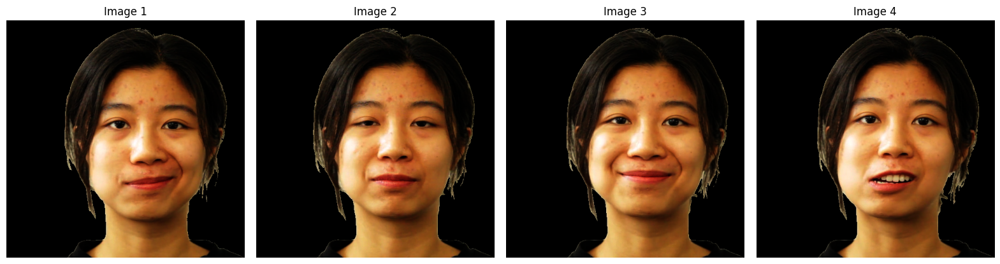

In [6]:
# gt
visualize_image_batch(views["img"])

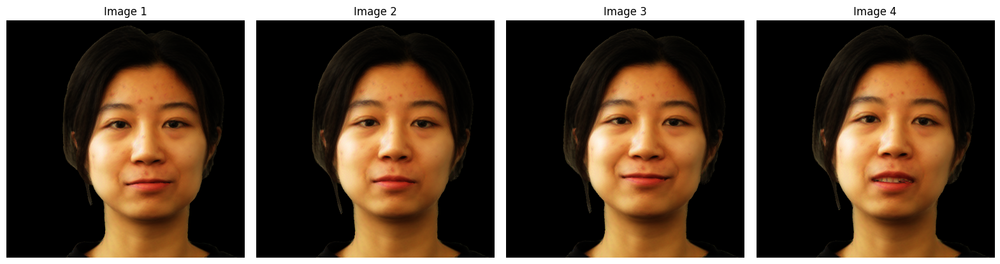

In [6]:
# pred
visualize_image_batch(rgb_pred)

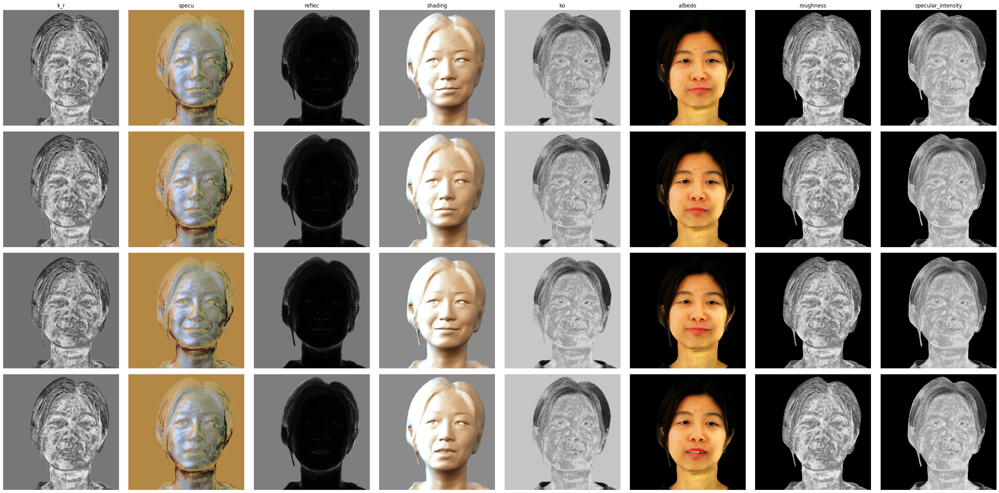

In [7]:
visualize_image_buffers(cbuffers)

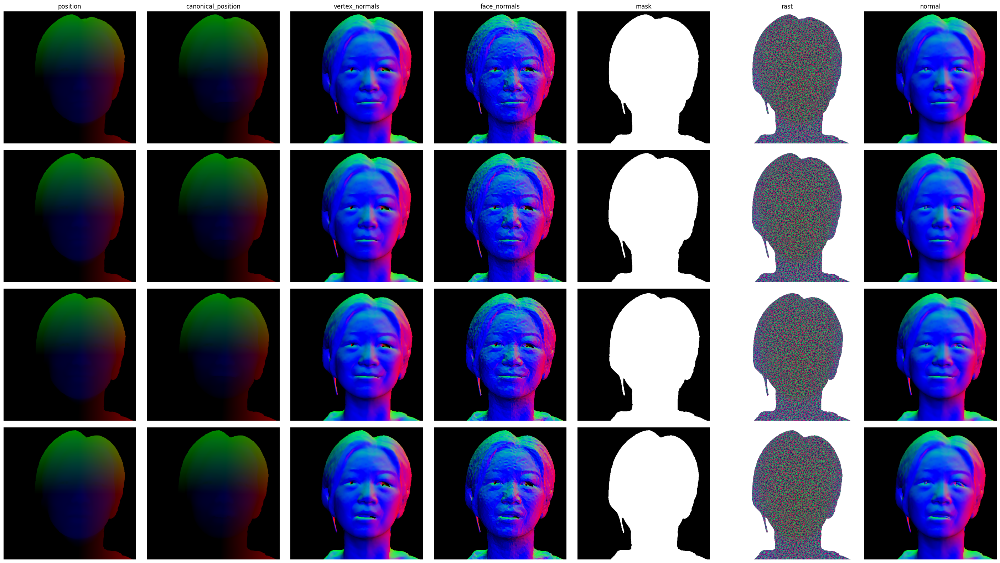

In [8]:
_gbuffers = {}
_gbuffers["position"] = gbuffers["position"]
_gbuffers["canonical_position"] = gbuffers["canonical_position"]
_gbuffers["vertex_normals"] = gbuffers["vertex_normals"]
_gbuffers["face_normals"] = gbuffers["face_normals"]
_gbuffers["mask"] = gbuffers["mask"]
_gbuffers["rast"] = gbuffers["rast"]
_gbuffers["normal"] = gbuffers["normal"]
visualize_image_buffers(_gbuffers)

In [9]:
from flare.metrics.metrics import img_mse, img_psnr, img_ssim

masked_pred, gt, mask = prepare_mask_for_metrics(rgb_pred, views)

print(img_mse(masked_pred, gt, mask=mask, use_mask=True))
print(img_ssim(masked_pred, gt))
print(img_psnr(masked_pred, gt, mask=mask))

tensor([0.0036, 0.0035, 0.0038, 0.0049])
tensor([0.8416, 0.8557, 0.8542, 0.8396])
tensor([24.4906, 24.5748, 24.2112, 23.1264])


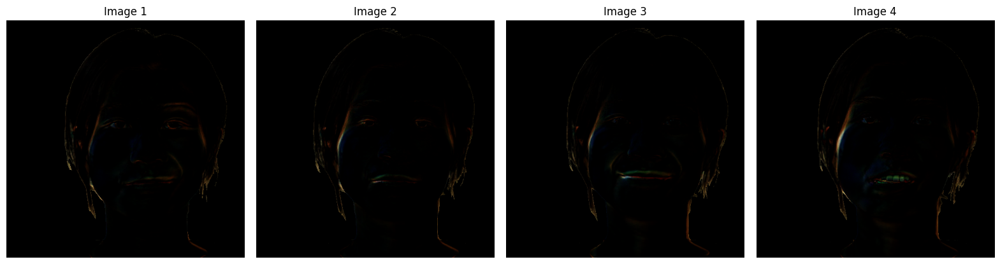

In [10]:
mse, error_mask = img_mse(masked_pred, gt, mask=mask, use_mask=True, return_all=True)
visualize_image_batch(error_mask.permute(0, 2, 3, 1))

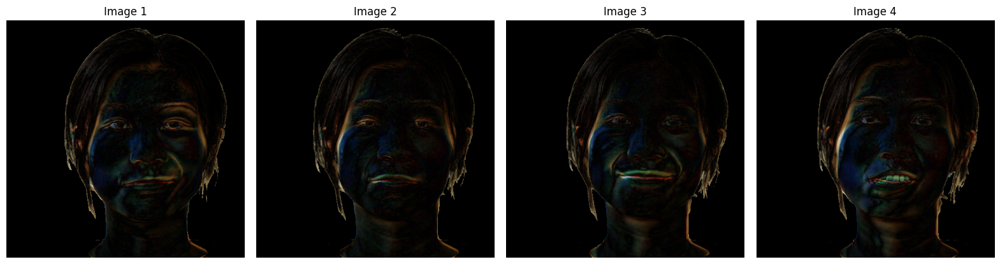

In [11]:
l1, error_mask = img_mse(masked_pred, gt, mask=mask, use_mask=True, return_all=True, error_type="mae")
visualize_image_batch(error_mask.permute(0, 2, 3, 1))

In [12]:
views["frame_name"]

['466', '1779', '1071', '920']

In [13]:
from flare.dataset.dataset_util import _load_img, _load_mask

albedo = torch.stack(
    [
        _load_img(f"/home/jsickert/adl4cv/DATA_rgbx/001/MVI_1812/{frame}.albedo.png")
        for frame in views["frame_name"]
    ]
)

roughness = torch.stack(
    [
        _load_img(f"/home/jsickert/adl4cv/DATA_rgbx/001/MVI_1812/{frame}.roughness.png")
        for frame in views["frame_name"]
    ]
)

roughness1c = roughness[..., :1]

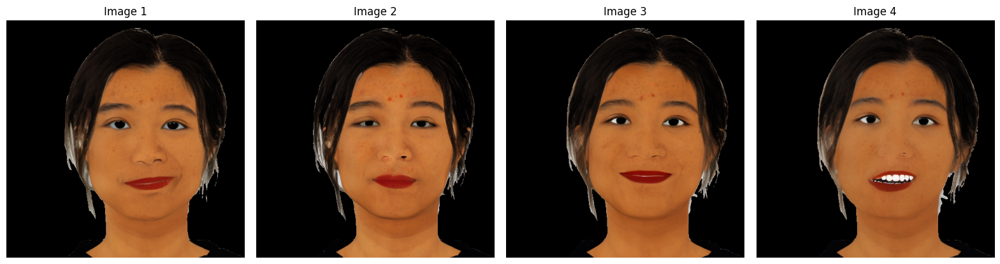

In [14]:
visualize_image_batch(albedo * views["mask"].cpu())

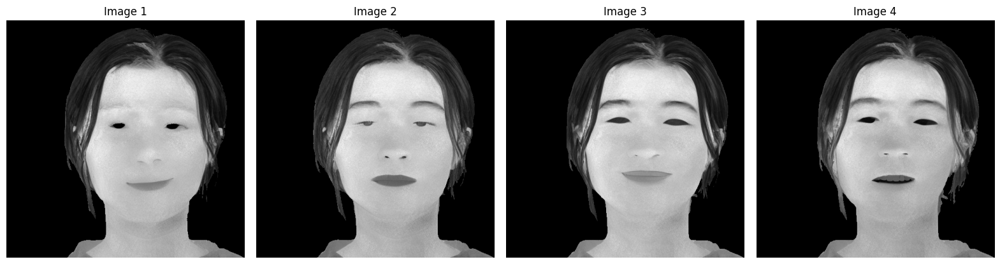

In [15]:
visualize_image_batch(roughness1c * views["mask"].cpu())

In [16]:
import nvdiffrast.torch as dr

device = torch.device("cuda:0")

def custom_shader_forward(shader, position, gbuffer, view_direction, mesh, light, deformed_position, albedo, roughness, skin_mask=None):
        bz, h, w, ch = position.shape
        pe_input = shader.apply_pe(position=position)

        view_dir = view_direction[:, None, None, :]
        normal_bend = shader.get_shading_normals(deformed_position, view_dir, gbuffer, mesh)

        # ==============================================================================================
        # Albedo ; roughness; specular intensity 
        # ==============================================================================================   
        all_tex = shader.material_mlp(pe_input.view(-1, shader.inp_size).to(torch.float32)) 
        kd = all_tex[..., :3].view(bz, h, w, ch)
        kr = all_tex[..., 3:4] 
        kr = kr.view(bz, h, w, 1).to(shader.device)
        ko = all_tex[..., 4:5]
        ko = ko.view(bz, h, w, 1)

        kd = albedo
        kr = roughness

        if skin_mask is not None:
            fresnel_constant = torch.ones((bz, h, w, 1)).to(shader.device) * 0.047
            fresnel_constant[skin_mask] = 0.028
        else:
            fresnel_constant = 0.04
   
        # ========= diffuse shading ===========
        kr_max = torch.ones((bz, h, w, 1))
        kr_max = kr_max.to(shader.device)                    
        enc_nd_kr_max = shader.dir_enc_func(normal_bend.view(-1, 3), kr_max.view(-1, 1))
        shading = shader.light_mlp(enc_nd_kr_max)
        shading = shading.view(bz, h, w, 3) 

        # ========= specular shading shading ===========
        color, buffers = light.shade_pbr_ipe(deformed_position, shading, shader.dir_enc_func, shader.light_mlp, normal_bend, kd, kr, view_dir, ko, normal_bend, fresnel_constant)

        return color, kd, buffers

def custom_shade(shader, gbuffer, views, mesh, finetune_color, lgt, albedo, roughness):
        positions = gbuffer["canonical_position"]
        batch_size, H, W, ch = positions.shape

        view_direction = torch.cat([v.center.unsqueeze(0) for v in views['camera']], dim=0)
        if finetune_color:
            ### skin mask for fresnel coefficient
            skin_mask = (torch.sum(views["skin_mask"][..., :3], axis=-1)).unsqueeze(-1)
            skin_mask = skin_mask * views["mask"] 
            skin_mask_bool = (skin_mask > 0.0).int().bool()
        else:
            skin_mask_bool = None

        ### compute the final color, and c-buffers 
        pred_color, albedo, buffers = custom_shader_forward(shader, positions, gbuffer, view_direction, mesh, light=lgt,
                                            deformed_position=gbuffer["position"], skin_mask=skin_mask_bool, albedo=albedo, roughness=roughness)
        pred_color = pred_color.view(positions.shape) 
        albedo = albedo.view(positions.shape)

        ### !! we mask directly with alpha values from the rasterizer !! ###
        pred_color_masked = torch.lerp(torch.zeros((batch_size, H, W, 4)).to(shader.device), 
                                    torch.concat([pred_color, torch.ones_like(pred_color[..., 0:1]).to(shader.device)], axis=3), gbuffer["mask"].float())
        roughness_masked = torch.lerp(torch.zeros((batch_size, H, W, 1)).to(shader.device), buffers["k_r"], gbuffer["mask"].float())
        ko_masked = torch.lerp(torch.zeros((batch_size, H, W, 1)).to(shader.device), buffers["ko"], gbuffer["mask"].float())
        albedo_masked = torch.lerp(torch.zeros((batch_size, H, W, 4)).to(shader.device), 
                                    torch.concat([albedo, torch.ones_like(pred_color[..., 0:1]).to(shader.device)], axis=3), gbuffer["mask"].float())
    
        ### we antialias the final color here (!)
        pred_color_masked = dr.antialias(pred_color_masked.contiguous(), gbuffer["rast"], gbuffer["deformed_verts_clip_space"], mesh.indices.int())
        roughness_masked = dr.antialias(roughness_masked.contiguous(), gbuffer["rast"], gbuffer["deformed_verts_clip_space"], mesh.indices.int())
        ko_masked = dr.antialias(ko_masked.contiguous(), gbuffer["rast"], gbuffer["deformed_verts_clip_space"], mesh.indices.int())

        buffers["albedo"] = albedo_masked[..., :3]
        buffers["roughness"] = roughness_masked[..., :1]
        buffers["specular_intensity"] = ko_masked[..., :1]
        return pred_color_masked[..., :3], buffers, pred_color_masked[..., -1:]

In [17]:
with torch.no_grad():
    shapedirs, posedirs, lbs_weights = deformer_net.query_weights(mesh.vertices)
    eval_vertices = mesh.vertices
    batched_verts = eval_vertices.unsqueeze(0).repeat(views["img"].shape[0], 1, 1)

    _, pose_features, transformations = FLAMEServer(expression_params=views["flame_expression"], full_pose=views["flame_pose"])
    transformations = torch.cat([torch.eye(4).unsqueeze(0).unsqueeze(0).expand(views["img"].shape[0], -1, -1, -1).float().to(device), transformations], 1)
    deformed_vertices = FLAMEServer.forward_pts_batch(pnts_c=batched_verts, betas=views["flame_expression"], transformations=transformations, pose_feature=pose_features, 
                                        shapedirs=shapedirs, posedirs=posedirs, lbs_weights=lbs_weights, dtype=torch.float32, map2_flame_original=True)

    d_normals = mesh.fetch_all_normals(deformed_vertices, mesh)
    ## ============== Rasterize ==============================
    gbuffers = renderer.render_batch(views["camera"], deformed_vertices.contiguous(), d_normals,
                        channels=channels_gbuffer, with_antialiasing=True, 
                        canonical_v=mesh.vertices, canonical_idx=mesh.indices)

    ## ============== predict color ==============================
    custom_rgb_pred, custom_cbuffers, custom_alpha = custom_shade(
        shader=shader,
        gbuffer=gbuffers,
        views=views,
        mesh=mesh,
        finetune_color=False,
        lgt=lgt,
        albedo=albedo.to(device),
        roughness=roughness1c.to(device))

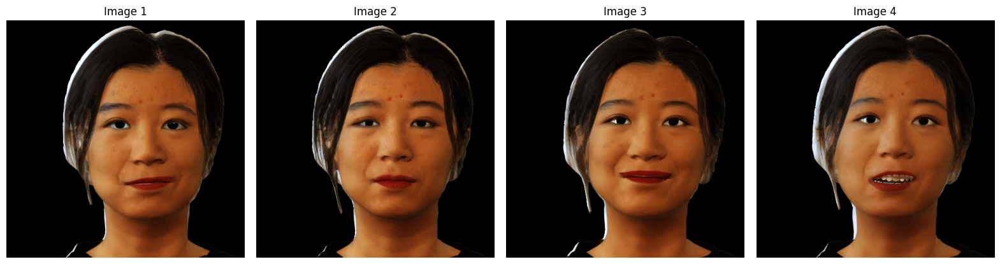

In [18]:
visualize_image_batch(custom_rgb_pred)

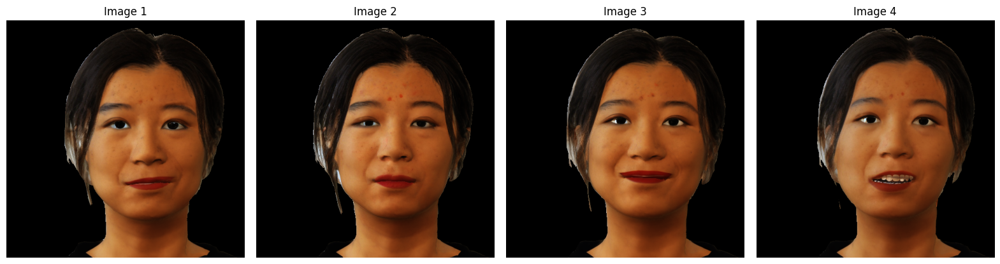

In [19]:
visualize_image_batch(custom_rgb_pred * views["mask"])

In [306]:
def to_masked_rgba(rgb_pred, mask1c):
    bz, H, W, _= rgb_pred.shape
    return torch.lerp(torch.zeros((bz, H, W, 4)), torch.concat([rgb_pred.cpu(), torch.ones_like(rgb_pred[..., 0:1]).cpu()], axis=3), mask1c.float())

In [25]:
custom_pred, custom_gt, custom_mask = prepare_mask_for_metrics(custom_rgb_pred, views)

print(img_mse(custom_pred, custom_gt, mask=custom_mask, use_mask=True))
print(img_ssim(custom_pred, custom_gt))
print(img_psnr(custom_pred, custom_gt, mask=custom_mask))

tensor([0.0093, 0.0091, 0.0110, 0.0128])
tensor([0.8250, 0.8322, 0.8131, 0.8083])
tensor([20.2997, 20.3860, 19.6024, 18.9293])


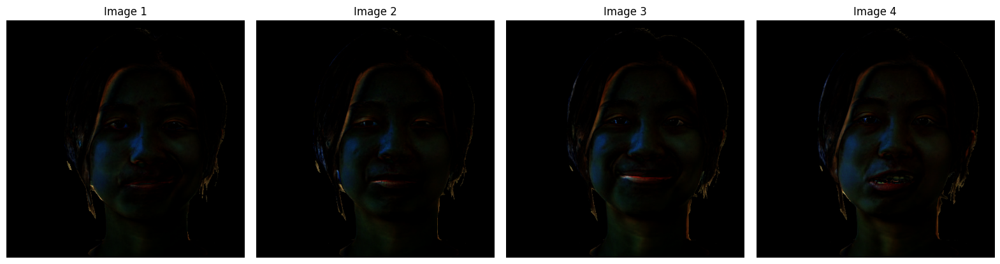

In [26]:
mse, error_mask = img_mse(custom_pred, custom_gt, mask=custom_mask, use_mask=True, return_all=True)
visualize_image_batch(error_mask.permute(0, 2, 3, 1))

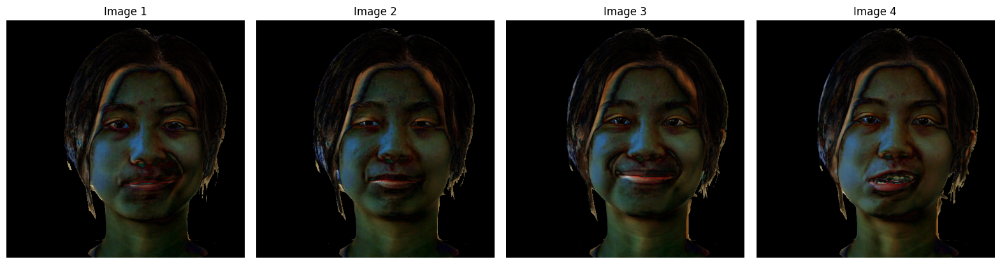

In [27]:
l1, error_mask = img_mse(custom_pred, custom_gt, mask=custom_mask, use_mask=True, return_all=True, error_type="mae")
visualize_image_batch(error_mask.permute(0, 2, 3, 1))

## Unwinding the immense mask confusion

- By default the input image `views["img"]` is masked with a 0/1 mask right at the beginning (which is loaded by `_load_mask` and is kind of broken).
- The predicted color is also masked by `gbuffers["mask"]`, which is again a 0/1 mask and is applied in this `torch.lerp` alongside with adding the alpha value. Seemingly this comes from the deformer net.
- Originally, all masks in the dataset are softmask, but this fact seems to be ignored throuhghout the whole codebase. Don't ask me why.
- Probably a more straighforward approach would be to use the softmask as is and first convert the three channels to one channels right after loading. See function `_better_load_mask`.

In [28]:
import imageio
import numpy as np

def _better_load_mask(fn: str):
    alpha = imageio.imread(fn).astype(np.float32)
    alpha = 0.299*alpha[...,0] + 0.587*alpha[...,1] + 0.114*alpha[...,2]
    alpha = torch.tensor(alpha).unsqueeze(-1)
    return alpha